### Conexión a ruta de Proyecto

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd 'drive/MyDrive/PROYECTOS_DIPLOMADO/VISION'

/content/drive/MyDrive/PROYECTOS_DIPLOMADO/VISION


In [ ]:
!ls

'Copy of U-NET_JOSE.ipynb'
'Copy of U-NET_JOSE_labels.ipynb'
'Copy of U-NET_JOSE_mas_epocas.ipynb'
'Copy of Untitled0_JOSE.ipynb'
 dataset_profa
 GoogleNet_DAR_1.ipynb
 GoogleNet_DAR.ipynb
 GoogleNet.ipynb
 GoogleNet_JIMM_1.ipynb
 MobileNet_DAR_1.ipynb
 MobileNet.ipynb
 models
'Proyecto de Visión Artificial - Segmentación y Clasificación de Árboles.gslides'
 ResNet_DAR_1.ipynb
 U-NET_JOSE.ipynb
 Untitled0.ipynb
 Untitled0_JOSE.ipynb
 urban-street_-tree-classification-DatasetNinja
 urban-street_-tree-DatasetNinja


### Librerías

In [ ]:
!pip install segmentation-models-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 59.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_6

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import functional as F
from PIL import Image, UnidentifiedImageError
import os
import json
import numpy as np
import base64
from io import BytesIO
import zlib
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.utils.metrics import IoU
import matplotlib.pyplot as plt
import cv2

### Clase TreeDataset

In [ ]:
path_dataset = 'urban-street_-tree-DatasetNinja'

In [ ]:
import json

with open(path_dataset + '/meta.json') as f:
    metadata = json.load(f)

classes = {i: cls['title'] for i, cls in enumerate(metadata['classes'])}
num_classes = len(classes) + 1  # +1 para el fondo

print(f"Número de clases: {num_classes}")
print(f"Clases: {classes}")

Número de clases: 23
Clases: {0: 'acer_palmatum', 1: 'cedrus_deodara', 2: 'celtis_sinensis', 3: 'cinnamomum_camphora_(linn)_presl', 4: 'elaeocarpus_decipiens', 5: 'flowering_cherry', 6: 'ginkgo_biloba', 7: 'koelreuteria_paniculata', 8: 'liquidambar_formosana', 9: 'liriodendron_chinense', 10: 'magnolia_grandiflora_l', 11: 'magnolia_liliflora_desr', 12: 'michelia_chapensis', 13: 'osmanthus_fragrans', 14: 'photinia_serratifolia', 15: 'platanus', 16: 'prunus_cerasifera_f._atropurpurea', 17: 'salix_babylonica', 18: 'sapindus_saponaria', 19: 'styphnolobium_japonicum', 20: 'triadica_sebifera', 21: 'zelkova_serrata'}


In [ ]:
len(classes)

22

In [ ]:
# Define TreeDataset
class TreeDataset(Dataset):
    def __init__(self, root, classes, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(os.path.join(root, "img"))))
        self.anns = list(sorted(os.listdir(os.path.join(root, "ann"))))
        self.classes = classes
        self.class_to_idx = {v: k for k, v in classes.items()}

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "img", self.imgs[idx])
        ann_path = os.path.join(self.root, "ann", self.anns[idx])

        img = Image.open(img_path).convert("RGB")
        with open(ann_path) as f:
            ann = json.load(f)

        masks = []
        labels = []
        for obj in ann['objects']:
            mask = self.create_mask_from_bitmap(obj['bitmap'], ann['size']['height'], ann['size']['width'])
            masks.append(mask)
            labels.append(self.class_to_idx[obj['classTitle']])

        # Combinar todas las máscaras en una única máscara binaria
        combined_mask = np.any(np.stack(masks, axis=0), axis=0).astype(np.uint8)

        # Convertir img y mask a numpy arrays
        img = np.array(img).astype(np.float32) / 255.0
        combined_mask = np.expand_dims(combined_mask, axis=0).astype(np.float32)  # Add channel dimension

        target = {}
        target["masks"] = torch.as_tensor(combined_mask, dtype=torch.float32)

        if self.transforms:
            augmented = self.transforms(image=img)
            img = augmented['image']
            _, target_height, target_width = img.shape

            # Resize mask to match the target size
            resized_mask = cv2.resize(combined_mask[0], (target_width, target_height), interpolation=cv2.INTER_NEAREST)
            target["masks"] = torch.as_tensor(np.expand_dims(resized_mask, axis=0), dtype=torch.float32)

        return img, target

    def __len__(self):
        return len(self.imgs)

    def create_mask_from_bitmap(self, bitmap, height, width):
        try:
            bitmap_data = bitmap['data']
            if isinstance(bitmap_data, str):
                bitmap_data = base64.b64decode(bitmap_data)

            compressed, decompressed_data = self.is_compressed(bitmap_data)
            if compressed:
                bitmap_data = decompressed_data

            image = Image.open(BytesIO(bitmap_data))
            mask = np.array(image)

            mask_resized = np.zeros((height, width), dtype=np.uint8)
            x, y = bitmap['origin']
            mask_resized[y:y + mask.shape[0], x:x + mask.shape[1]] = mask

            return mask_resized
        except (base64.binascii.Error, UnidentifiedImageError) as e:
            print(f"Error al procesar la imagen: {e}")
            print(f"Datos del bitmap: {bitmap['data']}")
            return np.zeros((height, width), dtype=np.uint8)

    def is_compressed(self, data):
        try:
            decompressed_data = zlib.decompress(data)
            return True, decompressed_data
        except zlib.error:
            return False, None

    def get_classes(self):
        return self.classes

    def get_class_to_idx(self):
        return self.class_to_idx

    def get_num_classes(self):
        return self.num_classes

    def get_img_path(self, idx):
        return os.path.join(self.root, "img", self.imgs[idx])

    def get_ann_path(self, idx):
        return os.path.join(self.root, "ann", self.anns[idx])

    def get_img_shape(self, idx):
        img_path = self.get_img_path(idx)
        img = Image.open(img_path).convert("RGB")
        return img.size

    def get_total_images(self):
        return len(self.imgs)

    def get_random_img_path(self):
        idx = np.random.randint(len(self.imgs))
        return self.get_img_path(idx)

    def get_random_ann_path(self):
        idx = np.random.randint(len(self.anns))
        return self.get_ann_path(idx)

    def get_random_img_and_ann_paths(self):
        idx = np.random.randint(len(self.imgs))
        img_path = self.get_img_path(idx)
        ann_path = self.get_ann_path(idx)
        return img_path, ann_path

    def get_img_and_mask(self, idx):
        img, target = self.__getitem__(idx)
        return img, target

    def get_random_img_and_mask(self):
        idx = np.random.randint(len(self.imgs))
        img, target = self.__getitem__(idx)
        return img, target

    def get_random_img(self):
        img_path = self.get_random_img_path()
        img = Image.open(img_path).convert("RGB")
        return img

### Carga de Dataset y Preprocesamiento

In [ ]:
def get_transform(train):
    if train:
        return A.Compose([
            A.Resize(height=1024, width=768),  # Ajusta el tamaño de la imagen y máscara a 512x512
            A.RandomBrightnessContrast(p=0.2),  # Brillo/contraste aleatorio con probabilidad 0.2
            ToTensorV2()
        ])
    else:
        return A.Compose([
            A.Resize(height=1024, width=768),
            ToTensorV2()
        ])


# Create datasets and dataloaders
dataset_train = TreeDataset(os.path.join(path_dataset, 'train'), classes, get_transform(train=True))
dataset_val = TreeDataset(os.path.join(path_dataset, 'val'), classes, get_transform(train=False))
dataset_test = TreeDataset(os.path.join(path_dataset, 'test'), classes, get_transform(train=False))

data_loader_train = DataLoader(dataset_train, batch_size=16, shuffle=True, num_workers=2, collate_fn=lambda x: tuple(zip(*x)))
data_loader_val = DataLoader(dataset_val, batch_size=16, shuffle=False, num_workers=2, collate_fn=lambda x: tuple(zip(*x)))
data_loader_test = DataLoader(dataset_test, batch_size=16, shuffle=False, num_workers=2, collate_fn=lambda x: tuple(zip(*x)))

(2, 3, 1024, 768)
(1024, 768, 3)
min: 0.0
max: 1.0
Masks shape: (1, 1024, 768)
Mask 0 shape: (1024, 768)


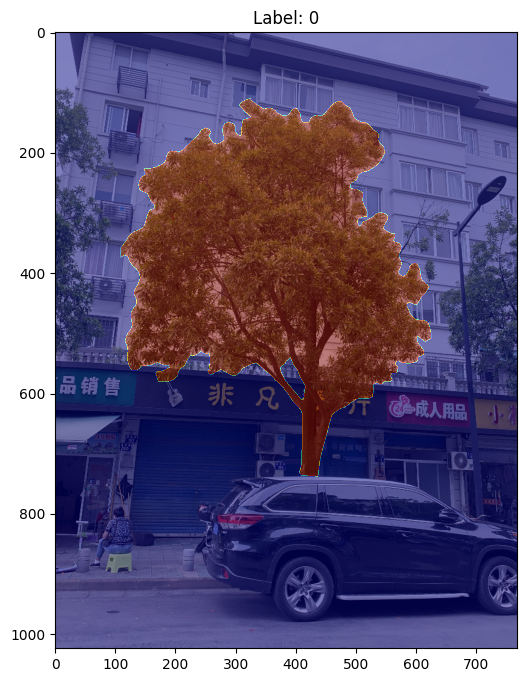

In [ ]:
# Visualizar las imágenes y las máscaras
for imgs, targets in data_loader_train:
    print(np.shape(imgs))
    for img, target in zip(imgs, targets):
        img = img.permute(1, 2, 0).numpy()  # Reordenar los ejes del tensor para que sean compatibles con matplotlib
        print(img.shape)
        # img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Desnormalizar la imagen
        # img = np.clip(img, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]
        # img = (img * 255).astype(np.uint8)
        print('min:', img.min())
        print('max:', img.max())

        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
        ax.imshow(img)

        # Dibujar las máscaras
        masks = target['masks'].numpy()
        print("Masks shape:", masks.shape)  # Imprimir la forma de las máscaras para debug

        # Si las máscaras solo tienen una capa, ajustar en consecuencia
        if masks.ndim == 3:  # Caso típico de máscaras con múltiples clases (C, H, W)
            for i in range(masks.shape[0]):
                mask = masks[i, :, :]
                print(f"Mask {i} shape:", mask.shape)
                if mask.max() > 0:  # Visualizar solo si hay alguna predicción en la máscara
                    ax.imshow(mask, alpha=0.5, cmap='jet')
                    ax.set_title(f"Label: {i}")
        elif masks.ndim == 2:  # Caso de una sola capa de máscara (H, W)
            ax.imshow(masks, alpha=0.5, cmap='jet')
            ax.set_title("Single mask layer")

        plt.show()
        break  # Mostrar solo el primer batch para evitar demasiadas visualizaciones
    break

### Transfer Learning

In [ ]:
import torch
import segmentation_models_pytorch as smp

# Definir el número de clases para la segmentación
num_classes = 22

# Cargar un modelo U-Net preentrenado con pesos de Imagenet
model = smp.Unet(
    encoder_name="resnet34",  # Puedes cambiar el backbone por otro compatible
    encoder_weights="imagenet",  # Usar pesos preentrenados de Imagenet
    in_channels=3,  # Entradas con 3 canales (imágenes RGB)
    classes=1,  # Número de clases de salida
)

# Mover el modelo al dispositivo adecuado (GPU o CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Imprimir la estructura del modelo
print(model)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 431MB/s]


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

###Entrenamiento (4 epocas)

In [ ]:

def compute_dice(pred, target, epsilon=1e-6):
    pred = pred.view(-1)
    target = target.view(-1)

    intersection = (pred * target).sum()
    dice = (2. * intersection + epsilon) / (pred.sum() + target.sum() + epsilon)
    return dice.item()

In [ ]:
# Initialize the model, loss function, and optimizer
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
)
model = model.to(device)

# Congelar todos los parámetros del modelo
for param in model.parameters():
    param.requires_grad = False

# Descongelar los parámetros de los últimos layers
for param in model.decoder.parameters():
    param.requires_grad = True

# También puedes descongelar el último bloque del encoder
for param in model.encoder.layer4.parameters():
    param.requires_grad = True

learning_rate = 0.001
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Listas para almacenar las métricas
train_losses = []
val_losses = []
val_ious = []
val_dices = []


# Training loop
num_epochs = 4

iou_metric = IoU(threshold=0.5)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    i = 0

    for batch in data_loader_train:
        imgs, targets = batch
        imgs = torch.stack(imgs).to(device)  # Apilar imágenes en un tensor y enviar a dispositivo
        masks = torch.stack([t["masks"] for t in targets]).float().to(device)  # Convertir a tipo Long para la máscara
        #labels = torch.cat([t["labels"] for t in targets]).to(device)  # Concatenar etiquetas y enviar a dispositivo

        # Verificar las dimensiones de imgs, masks y labels
        #print('imgs shape:', imgs.shape)
        #print('masks shape:', masks.shape)
        #print('labels shape:', labels.shape)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * imgs.size(0)

        epoch_loss = running_loss / len(data_loader_train)
        i += 1

        print(f"Epoch {epoch + 1}/{num_epochs}, Iteration {i}, Loss: {epoch_loss:.4f}")

    train_losses.append(epoch_loss)

    # Validación
    model.eval()
    val_loss = 0.0
    ious = []
    dices = []
    with torch.no_grad():
        for batch in data_loader_val:
            imgs, targets = batch
            imgs = torch.stack(imgs).to(device)  # Apilar imágenes en un tensor y enviar a dispositivo
            masks = torch.stack([t["masks"] for t in targets]).float().to(device)  # Convertir a tipo Long para la máscara
            #labels = torch.cat([t["labels"] for t in targets]).to(device)  # Concatenar etiquetas y enviar a dispositivo

            # Forward pass
            outputs = model(imgs)

            # Calcular la pérdida
            loss = criterion(outputs, masks)

            val_loss += loss.item()

            # Calcular métricas
            preds = torch.sigmoid(outputs) > 0.5
            for pred, mask in zip(preds, masks):
                ious.append(iou_metric(pred, mask).item())
                dices.append(compute_dice(pred, mask))

    val_loss /= len(data_loader_val)
    val_losses.append(val_loss)
    val_ious.append(np.mean(ious))
    val_dices.append(np.mean(dices))
    print(f'Validation Loss: {val_loss:.4f}, IoU: {np.mean(ious):.4f}, Dice: {np.mean(dices):.4f}')

Epoch 1/4, Iteration 1, Loss: 0.0581
Epoch 1/4, Iteration 2, Loss: 0.1090
Epoch 1/4, Iteration 3, Loss: 0.1541
Epoch 1/4, Iteration 4, Loss: 0.1925
Epoch 1/4, Iteration 5, Loss: 0.2322
Epoch 1/4, Iteration 6, Loss: 0.2654
Epoch 1/4, Iteration 7, Loss: 0.2960
Epoch 1/4, Iteration 8, Loss: 0.3268
Epoch 1/4, Iteration 9, Loss: 0.3569
Epoch 1/4, Iteration 10, Loss: 0.3869
Epoch 1/4, Iteration 11, Loss: 0.4122
Epoch 1/4, Iteration 12, Loss: 0.4384
Epoch 1/4, Iteration 13, Loss: 0.4637
Epoch 1/4, Iteration 14, Loss: 0.4883
Epoch 1/4, Iteration 15, Loss: 0.5158
Epoch 1/4, Iteration 16, Loss: 0.5391
Epoch 1/4, Iteration 17, Loss: 0.5621
Epoch 1/4, Iteration 18, Loss: 0.5858
Epoch 1/4, Iteration 19, Loss: 0.6101
Epoch 1/4, Iteration 20, Loss: 0.6363
Epoch 1/4, Iteration 21, Loss: 0.6604
Epoch 1/4, Iteration 22, Loss: 0.6823
Epoch 1/4, Iteration 23, Loss: 0.7037
Epoch 1/4, Iteration 24, Loss: 0.7256
Epoch 1/4, Iteration 25, Loss: 0.7502
Epoch 1/4, Iteration 26, Loss: 0.7720
Epoch 1/4, Iteration 

### Guardado del modelo

In [46]:
torch.save(model.state_dict(), '/content/drive/MyDrive/unet_model_seg_weights_4.pth')

In [47]:
torch.save(model, '/content/drive/MyDrive/unet_model_seg_4.pth')

###Grafica de Loss e IoU vs. Epoca

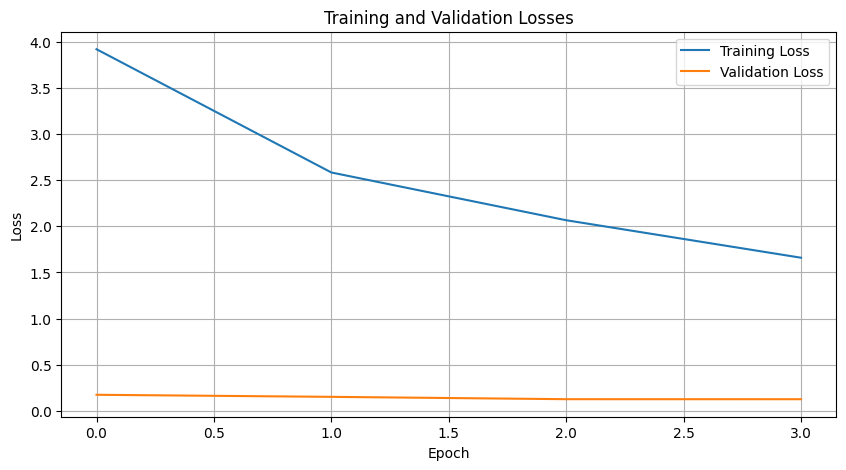

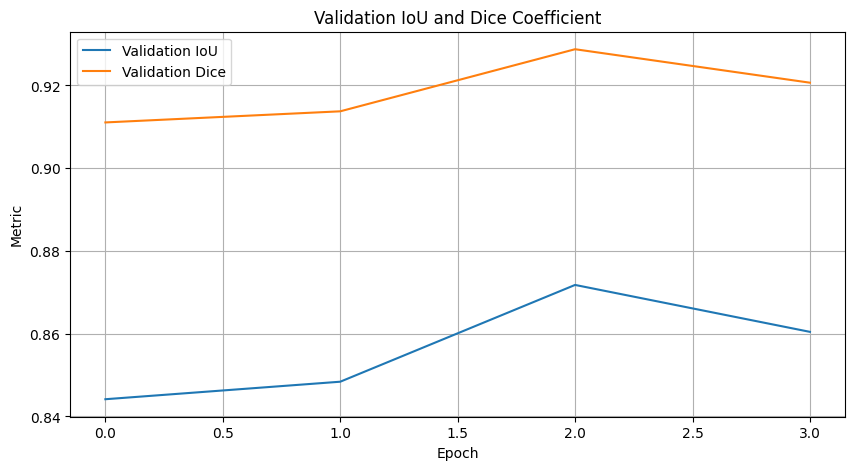

In [ ]:
# Graficar las métricas
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(val_ious, label='Validation IoU')
plt.plot(val_dices, label='Validation Dice')
plt.xlabel('Epoch')
plt.ylabel('Metric')
plt.title('Validation IoU and Dice Coefficient')
plt.legend()
plt.grid(True)
plt.show()

###Muestra de resultados

In [ ]:
def visualize_predictions(model, image_path, transform):
    """
    Visualiza las predicciones del modelo U-Net junto con la imagen original.

    Args:
    - model (torch.nn.Module): El modelo U-Net entrenado.
    - image_path (str): La ruta de la imagen del dataset.
    - transform (callable): Las transformaciones aplicadas a la imagen.
    - class_labels (dict): Diccionario de labels de clases {label: nombre}.
    """
    # Cargar la imagen
    img = Image.open(image_path).convert("RGB")
    img = np.array(img).astype(np.float32) / 255.0
    print(img.shape)
    # Preprocesar la imagen
    transformed = transform(image=img)
    img = transformed['image']
    # Convertir la imagen a tensor y enviar al dispositivo adecuado
    img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)
    print(img_tensor.shape)
    # Realizar la predicción
    with torch.no_grad():
        output = model(img_tensor)

    # Obtener la máscara predicha
    predicted_mask = torch.sigmoid(output.squeeze()).cpu().numpy()
    predicted_mask = (predicted_mask > 0.5).astype(np.uint8)  # Umbral de 0.5 para binarizar la máscara

    # Crear una imagen RGB para visualizar la máscara con la clase
    height, width = predicted_mask.shape
    label_color = (0, 255, 0)

    # Normalizar la imagen original para mostrarla correctamente en matplotlib
    img = (np.array(img) * 255).astype(np.uint8)
    img = np.transpose(img, (1, 2, 0))
    print(img.shape)

    # Aplicar la máscara a la imagen original
    img_with_mask = img.copy()
    img_with_mask[predicted_mask == 1] = label_color


    # Visualizar la imagen original y la máscara predicha con labels
    plt.figure(figsize=(15, 7))

    # Mostrar la imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Imagen Original')
    plt.axis('off')

    # Mostrar la máscara predicha con labels
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.imshow(img_with_mask, alpha=0.7)
    plt.title('Máscara Predicha con Labels')
    plt.axis('off')



    plt.tight_layout()
    plt.show()


(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


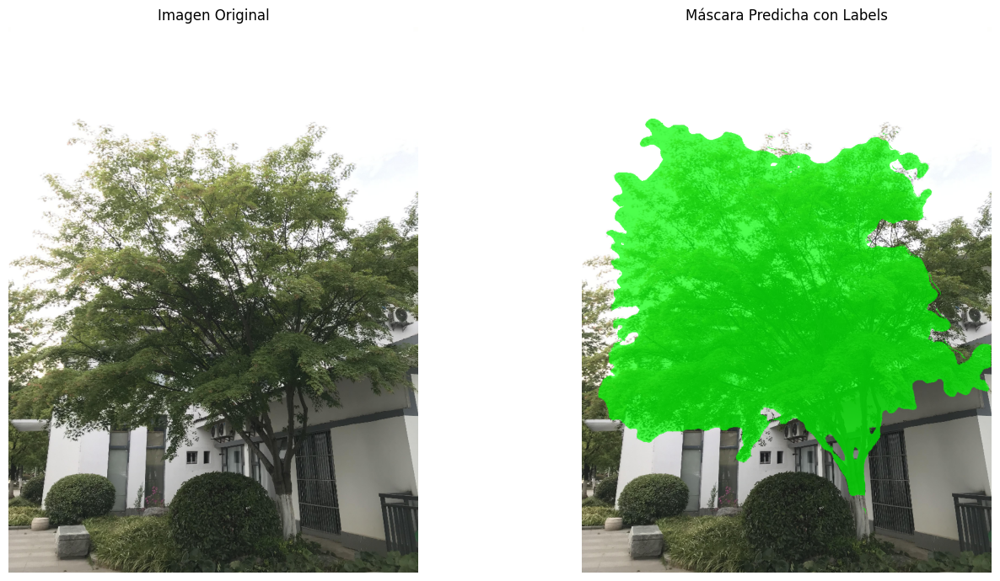

In [ ]:
image_path = data_loader_test.dataset.get_img_path(5)
visualize_predictions(model, image_path, get_transform(False))

(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


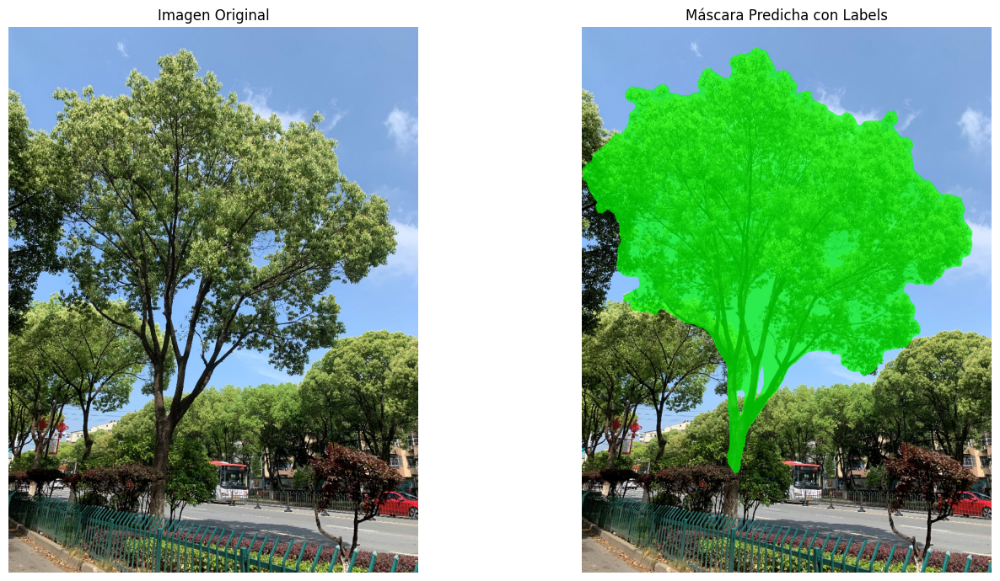

In [ ]:
image_path = data_loader_test.dataset.get_img_path(55)
visualize_predictions(model, image_path, get_transform(False))

(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


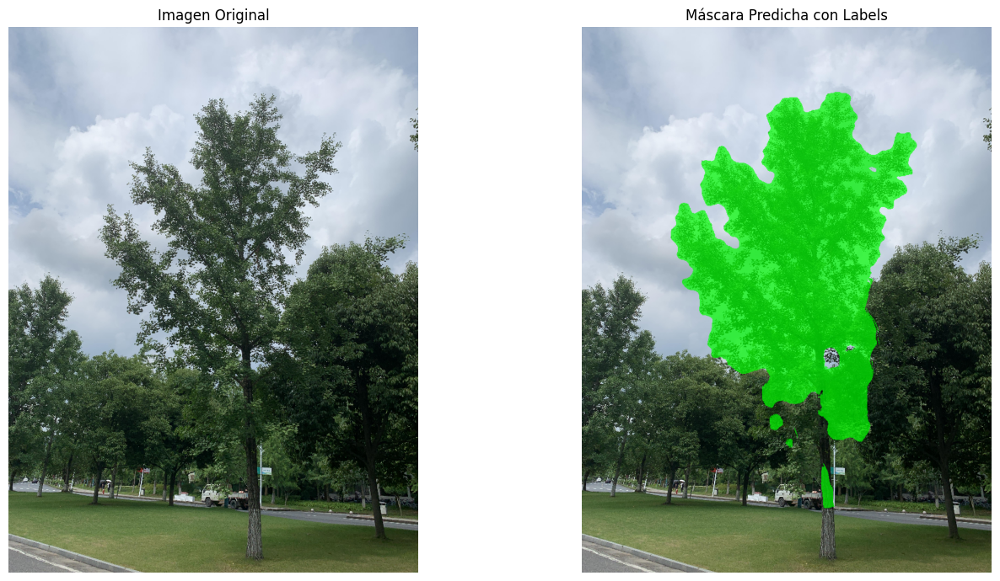

In [ ]:
image_path = data_loader_test.dataset.get_img_path(105)
visualize_predictions(model, image_path, get_transform(False))

(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


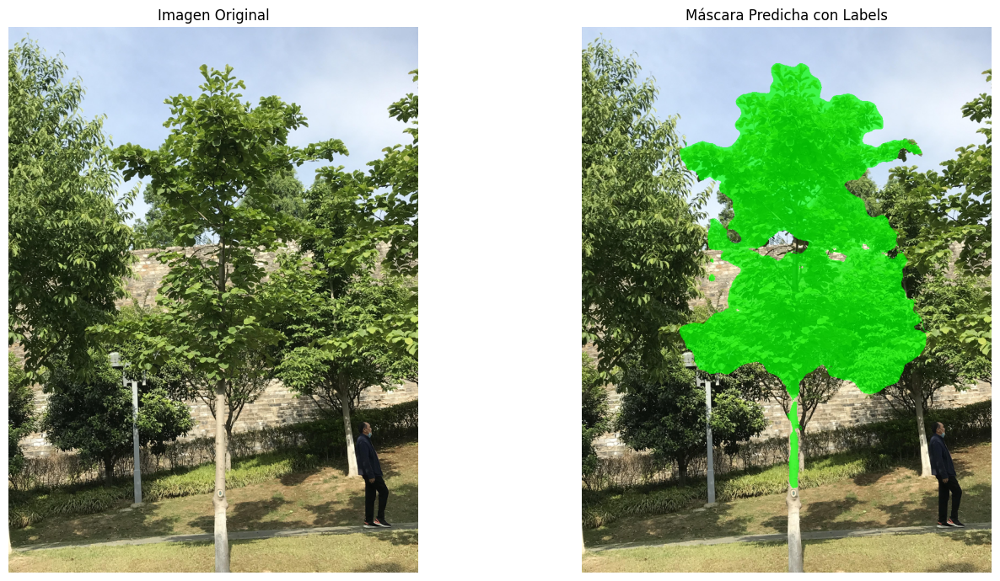

In [42]:
image_path = data_loader_test.dataset.get_img_path(205)
visualize_predictions(model, image_path, get_transform(False))

### 5 mejores vs. 5 peores predicciones

In [ ]:
import matplotlib.pyplot as plt

def evaluate_model(model, data_loader_test, device):
    model.eval()
    iou_metric = IoU(threshold=0.5)
    results = []

    with torch.no_grad():
        for idx, batch in enumerate(data_loader_test):
            imgs, targets = batch
            imgs = torch.stack(imgs).to(device)
            masks = torch.stack([t["masks"] for t in targets]).float().to(device)
            img_paths = [data_loader_test.dataset.get_img_path(i) for i in range(len(imgs))]

            outputs = model(imgs)
            preds = torch.sigmoid(outputs) > 0.5

            for img_path, img, pred, mask in zip(img_paths, imgs, preds, masks):
                iou = iou_metric(pred, mask).item()
                results.append((img_path, img.cpu(), mask.cpu(), pred.cpu(), iou))

    return results

# Call the function
results = evaluate_model(model, data_loader_test, device)

# Sort results based on IoU
results.sort(key=lambda x: x[4], reverse=True)

# Select the top 5 and bottom 5 results
best_results = results[:5]
worst_results = results[-5:]

def plot_results(results, title):
    for i, (img_path, img, mask, pred, iou) in enumerate(results):
        img = img.permute(1, 2, 0).numpy()
        mask = mask.squeeze().numpy()
        pred = pred.squeeze().numpy()

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(img)
        plt.imshow(mask, alpha=0.5, cmap='jet')
        plt.title('True Mask')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(img)
        plt.imshow(pred, alpha=0.5, cmap='jet')
        plt.title(f'Predicted Mask (IoU: {iou:.4f})')
        plt.axis('off')

        plt.suptitle(f'Image: {img_path}')
        plt.tight_layout()
        plt.show()

print("Best Results:")
plot_results(best_results, "Best IoU Results")

print("Worst Results:")
plot_results(worst_results, "Worst IoU Results")


Output hidden; open in https://colab.research.google.com to view.

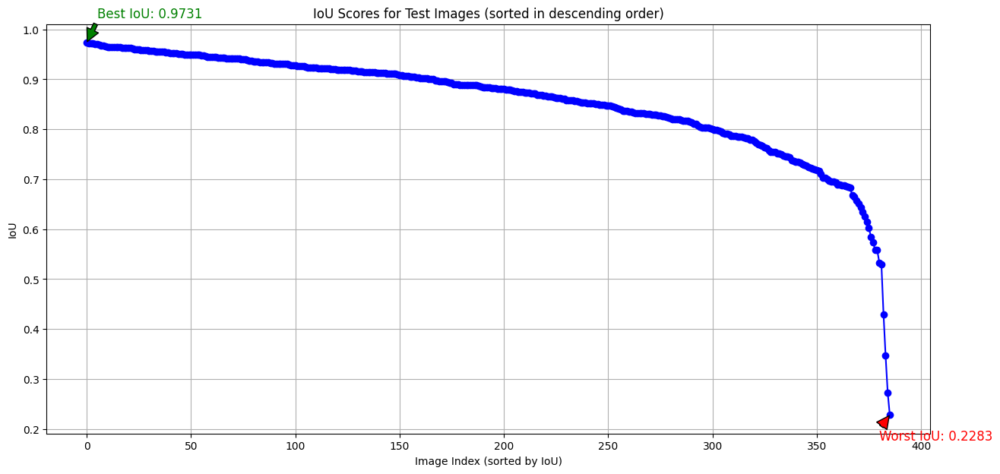

In [49]:
# Function to plot all IoUs in results
def plot_all_ious(results):
    # Sort results based on IoU
    results.sort(key=lambda x: x[4], reverse=True)

    # Extract IoUs and image paths
    ious = [result[4] for result in results]
    img_paths = [result[0] for result in results]

    # Create a plot
    plt.figure(figsize=(15, 7))
    plt.plot(ious, marker='o', linestyle='-', color='b')
    plt.xlabel('Image Index (sorted by IoU)')
    plt.ylabel('IoU')
    plt.title('IoU Scores for Test Images (sorted in descending order)')
    plt.grid(True)

    # Annotate the best IoU
    best_iou_idx = 0
    plt.annotate(f'Best IoU: {ious[best_iou_idx]:.4f}',
                 xy=(best_iou_idx, ious[best_iou_idx]),
                 xytext=(best_iou_idx + 5, ious[best_iou_idx] + 0.05),
                 arrowprops=dict(facecolor='green', shrink=0.05),
                 fontsize=12, color='green')

    # Annotate the worst IoU
    worst_iou_idx = len(ious) - 1
    plt.annotate(f'Worst IoU: {ious[worst_iou_idx]:.4f}',
                 xy=(worst_iou_idx, ious[worst_iou_idx]),
                 xytext=(worst_iou_idx - 5, ious[worst_iou_idx] - 0.05),
                 arrowprops=dict(facecolor='red', shrink=0.05),
                 fontsize=12, color='red')

    # Show the plot
    plt.show()

# Call the function
plot_all_ious(results)


### Resultados aleatorios


urban-street_-tree-DatasetNinja/test/img/Zelkova serrata_tree_1 (141).jpg
(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


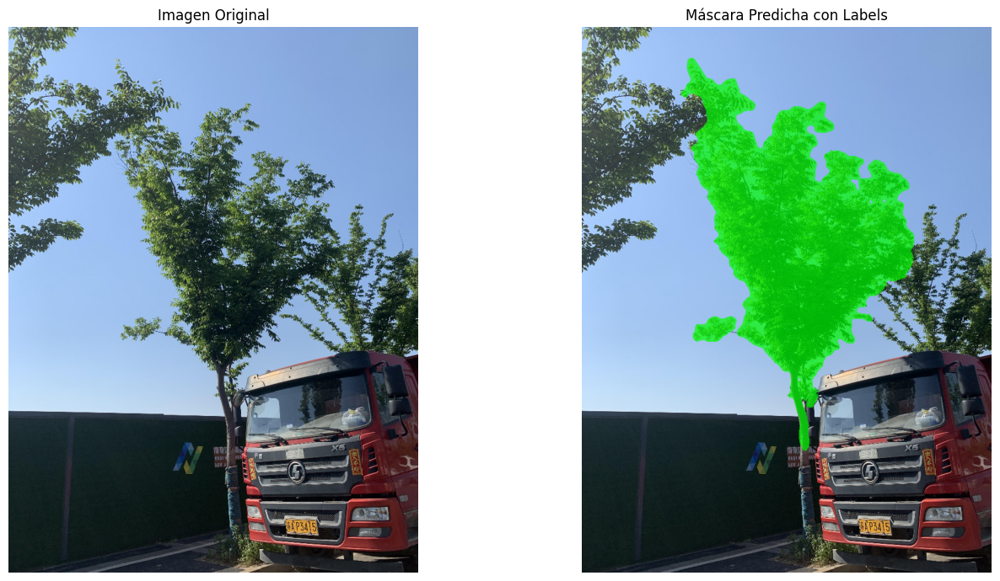

In [ ]:
image_path = data_loader_test.dataset.get_random_img_path()
print(image_path)
visualize_predictions(model, image_path, get_transform(False))

urban-street_-tree-DatasetNinja/test/img/Flowering cherry_tree_1 (124).jpg
(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


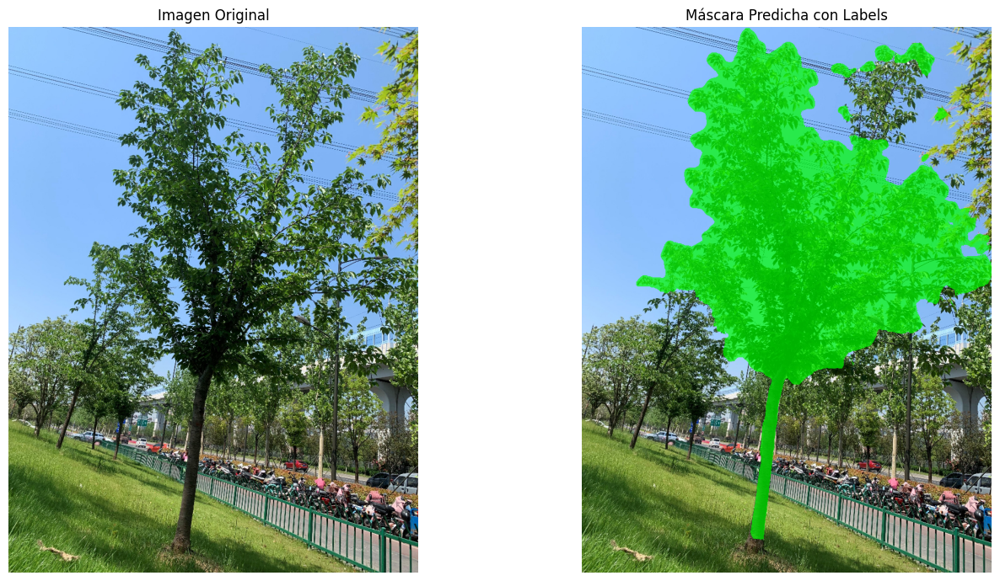

In [ ]:
image_path = data_loader_test.dataset.get_random_img_path()
print(image_path)
visualize_predictions(model, image_path, get_transform(False))

urban-street_-tree-DatasetNinja/test/img/Magnolia liliflora Desr_tree_1 (2).jpg
(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


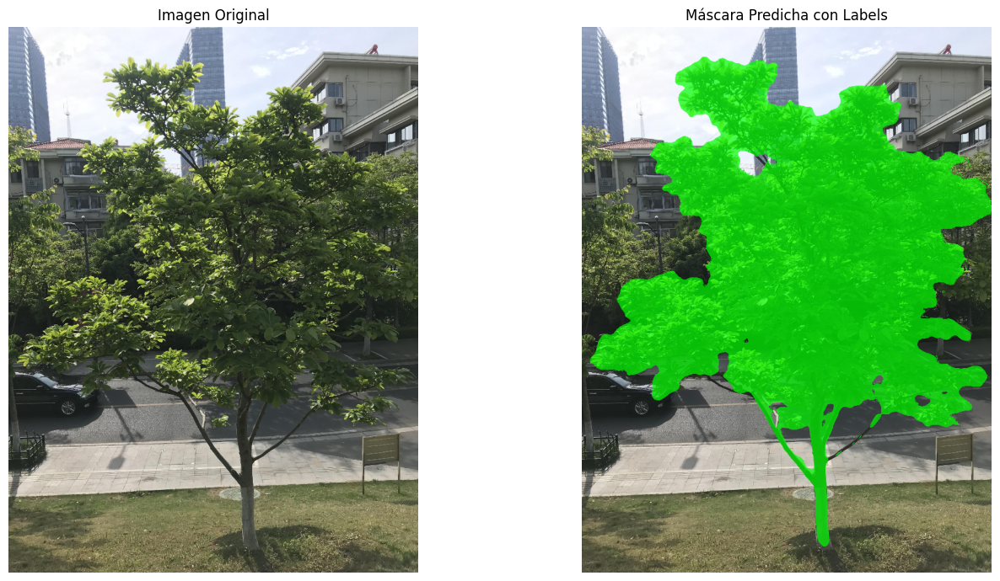

In [43]:
image_path = data_loader_test.dataset.get_random_img_path()
print(image_path)
visualize_predictions(model, image_path, get_transform(False))

urban-street_-tree-DatasetNinja/test/img/Styphnolobium japonicum_tree_1 (187).jpg
(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


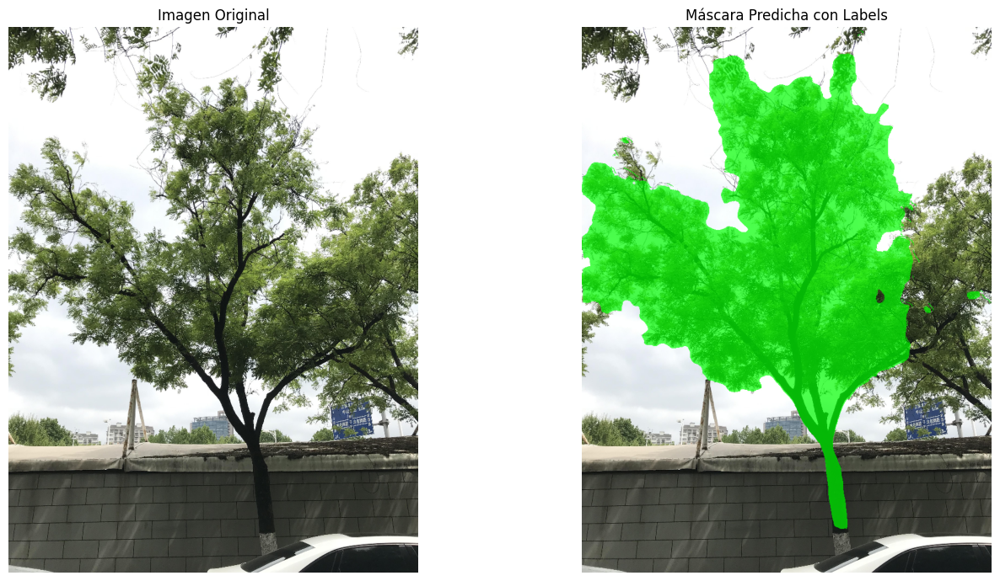

In [44]:
image_path = data_loader_test.dataset.get_random_img_path()
print(image_path)
visualize_predictions(model, image_path, get_transform(False))

urban-street_-tree-DatasetNinja/test/img/Liriodendron chinense_tree_1 (11).jpg
(4032, 3024, 3)
torch.Size([1, 3, 1024, 768])
(1024, 768, 3)


<ipython-input-16-49e672f96381>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_tensor = torch.unsqueeze(torch.tensor(img, dtype=torch.float32), 0).to(device)


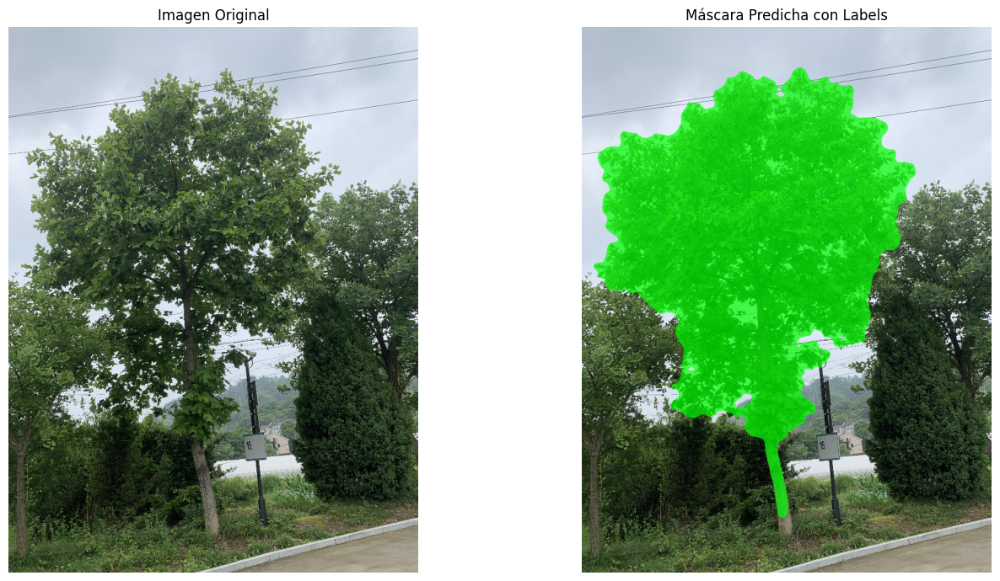

In [48]:
image_path = data_loader_test.dataset.get_random_img_path()
print(image_path)
visualize_predictions(model, image_path, get_transform(False))